In [ ]:
!pip uninstall -y requests
!pip install requests==2.31.0
import os
os.kill(os.getpid(), 9)



Found existing installation: requests 2.31.0
Uninstalling requests-2.31.0:
  Successfully uninstalled requests-2.31.0
  Using cached requests-2.31.0-py3-none-any.whl.metadata (4.6 kB)
Using cached requests-2.31.0-py3-none-any.whl (62 kB)


In [4]:
import requests
print(requests.__version__)


2.31.0


In [2]:
#clone YOLOv5 repository
# !git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

/content/yolov5


In [3]:
# !pip install requests==2.31.0



!pip install -qr requirements.txt
import torch

from IPython.display import Image, clear_output
# clear_output()
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.3.1+cu121 (Tesla T4)


In [4]:
import requests
print(requests.__version__)

2.32.3


In [5]:
pwd


'/content/yolov5'

In [6]:
%cd /content


/content


In [7]:
import gdown

# Correct Google Drive file ID and construct the download URL
file_id = '1VR965x43fG3EkWjMsDTzCqOEPhAgTBXu'
download_url = f'https://drive.google.com/uc?id={file_id}'

# Set the output path
output_path = 'downloaded_file.zip'  # Set the desired output path and file name

# Download the file
gdown.download(download_url, output_path, quiet=False)

print(f'File downloaded to {output_path}')


Downloading...
From (original): https://drive.google.com/uc?id=1VR965x43fG3EkWjMsDTzCqOEPhAgTBXu
From (redirected): https://drive.google.com/uc?id=1VR965x43fG3EkWjMsDTzCqOEPhAgTBXu&confirm=t&uuid=d279f66a-4338-4b94-adf5-77adb6033d02
To: /content/downloaded_file.zip
100%|██████████| 261M/261M [00:01<00:00, 209MB/s]

File downloaded to downloaded_file.zip


In [8]:
!unzip downloaded_file.zip
!rm downloaded_file.zip

Archive:  downloaded_file.zip
   creating: traffic/
  inflating: traffic/dataset.yaml    
   creating: traffic/train/
   creating: traffic/train/images/
  inflating: traffic/train/images/00001.jpg  
  inflating: traffic/train/images/00002.jpg  
  inflating: traffic/train/images/00004.jpg  
  inflating: traffic/train/images/00005.jpg  
  inflating: traffic/train/images/00006.jpg  
  inflating: traffic/train/images/00007.jpg  
  inflating: traffic/train/images/00008.jpg  
  inflating: traffic/train/images/00009.jpg  
  inflating: traffic/train/images/00010.jpg  
  inflating: traffic/train/images/00011.jpg  
  inflating: traffic/train/images/00014.jpg  
  inflating: traffic/train/images/00016.jpg  
  inflating: traffic/train/images/00017.jpg  
  inflating: traffic/train/images/00018.jpg  
  inflating: traffic/train/images/00019.jpg  
  inflating: traffic/train/images/00020.jpg  
  inflating: traffic/train/images/00021.jpg  
  inflating: traffic/train/images/00022.jpg  
  inflating: traffi

In [9]:
pwd


'/content'

In [12]:
%cd traffic
%cat dataset.yaml

[Errno 2] No such file or directory: 'traffic'
/content/traffic
# train and val data
train: '/content/traffic/train/images'
val: '/content/traffic/val/images'

# number of classes
nc: 4

# class names
names: ['speed limit', 'yield', 'mandatory', 'other']


In [13]:
import yaml
with open("dataset.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [14]:
print(num_classes)
%cd /content


4
/content


In [15]:
%cat /content/yolov5/models/yolov5s.yaml


# Ultralytics YOLOv5 🚀, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4],

In [16]:
from IPython.core.magic import register_line_cell_magic
@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))


In [17]:
%cd /content

/content


In [18]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector
### Next, we'll fire off training!
Here, we are able to pass a number of arguments:

1. img: define input image size
2. batch: determine batch size
3. epochs: define the number of training epochs. (Note: often, 3000+ are common here!)
4. data: set the path to our yaml file
5. cfg: specify our model configuration
6. weights: specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive folder)
7. name: result names
8. nosave: only save the final checkpoint
9. cache: cache images for faster training

In [23]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
# !python train.py --img 415 --batch 16 --epochs 30 --data '/content/traffic/dataset.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache
!python train.py --img 415 --batch 16 --epochs 50 --data '/content/traffic/dataset.yaml' --weights 'yolov5s.pt' --name yolov5s_result --cache


/content/yolov5
2024-07-29 10:27:02.345017: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-29 10:27:02.345070: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-29 10:27:02.346589: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/traffic/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_s


#Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the --name flag when we train. In our case, we named this yolov5s_results. (If given no name, it defaults to results.txt.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed results.txt files can be plotted with from utils.utils import plot_results; plot_results().

In [24]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

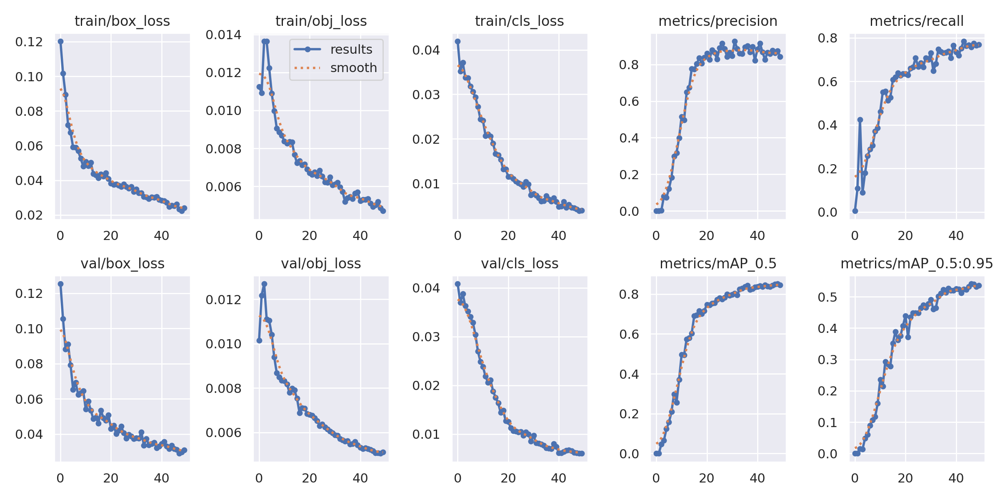

In [26]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_result/results.png', width=1000)  # view results.png


#Curious? Visualize Our Training Data with Labels
After training starts, view train*.jpg images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in YOLOv4.

GROUND TRUTH TRAINING DATA:


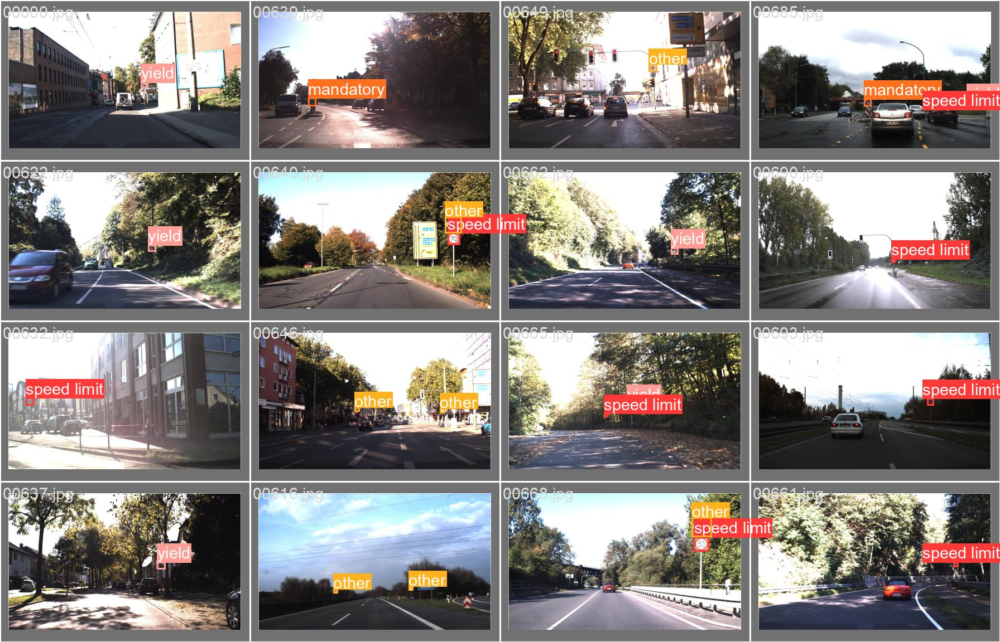

In [28]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_result/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


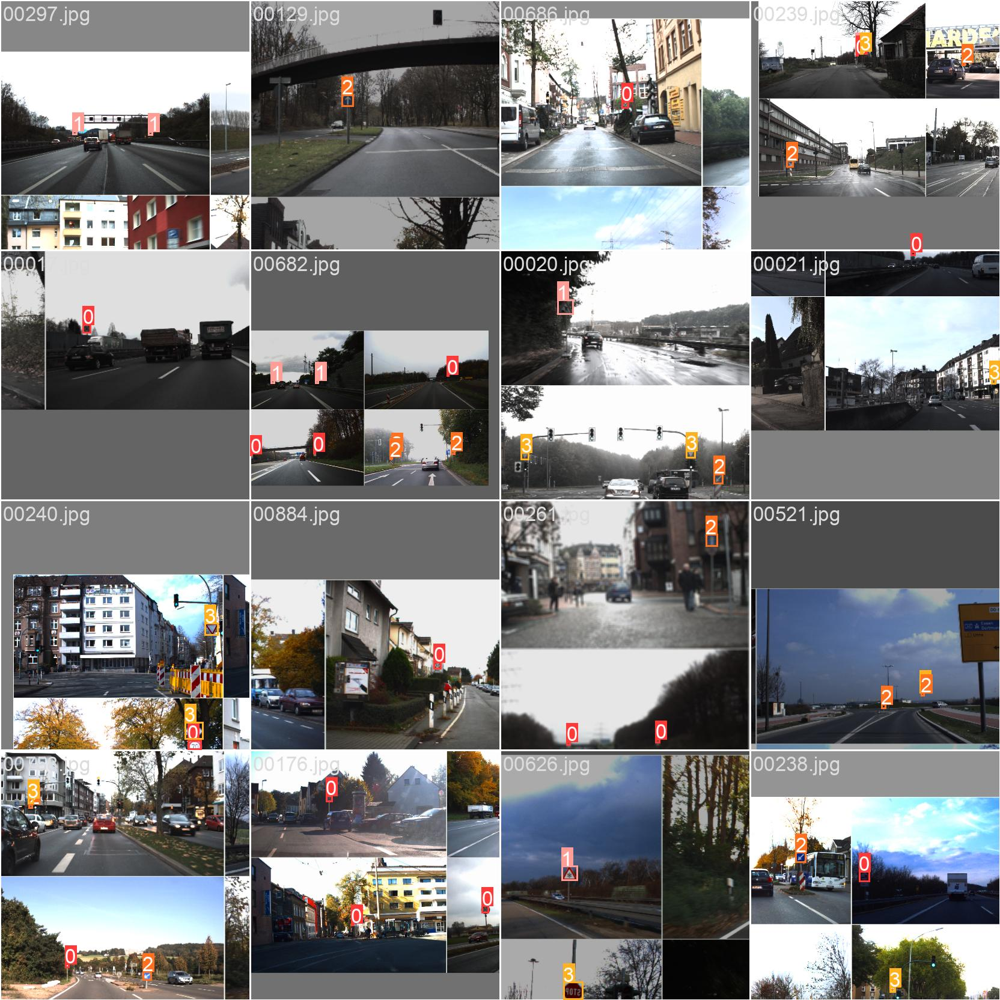

In [29]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)


#Run Inference With Trained Weights
Run inference with a pretrained checkpoint on contents of test/images folder downloaded from Roboflow.

In [30]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [31]:
%ls runs/train/yolov5s_result/weights

best.pt  last.pt


In [32]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_result/weights/best.pt --img 415 --conf 0.5 --source /content/traffic/val/images


/content/yolov5
detect: weights=['runs/train/yolov5s_result/weights/best.pt'], source=/content/traffic/val/images, data=data/coco128.yaml, imgsz=[415, 415], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-350-g6096750f Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [415, 415] must be multiple of max stride 32, updating to [416, 416]
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/148 /content/traffic/val/images/00000.jpg: 256x416 1 yield, 50.6ms
image 2/148 /content/traffic/val/images/00003.jpg: 256x416 (no detections), 10.8ms
imag

In [34]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [37]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/trafficSignDetection/model